### Load libraries

In [1]:
from matplotlib import pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.dates as mdates
from itertools import islice
import torch
import os
import wandb
from gluonts.dataset.repository import get_dataset, dataset_names
from gluonts.dataset.util import to_pandas
from gluonts.dataset.common import ListDataset
from tqdm.autonotebook import tqdm
from gluonts.evaluation import make_evaluation_predictions, Evaluator
from gluonts.dataset.pandas import PandasDataset
from lag_llama.gluon.estimator import LagLlamaEstimator

/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/tmp/ipykernel_2895/1724617453.py:12: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


Several facotrs of input signals may impact prediction results:
- Magnitude (the bigger the better)
- Frequency (the bigger the better)

In [109]:
def generateSine(n_rows, n_cols, isAmpBig, isFreqVar):

    np.random.seed(42)
    x = np.linspace(0, 1, n_rows)

    data = {} # Create a dictionary to store all columns
    for i in range(n_cols):
        a = np.random.uniform(2, 8) if isAmpBig else np.random.uniform(0.5, 2) # Amplitude
        b = np.random.uniform(-1, 1)  # Linear trend
        c = np.random.uniform(-1, 1) if isFreqVar else 1  # Whether frequency is set a variable 
        d = np.random.uniform(0, 2*np.pi)  # Phase shift
        e = np.random.uniform(-10, 10)  # First-order shift
        f = np.random.uniform(-10, 10)  # Vertical shift
        
        y = a * (x + b) * np.sin(200*np.pi * c * x + d) + e * x + f # Generate the sine curve
        
        data[f'curve_{i+1}'] = y 
    df = pd.DataFrame(data)  # Create DataFrame all at once
    df.index = pd.to_datetime(df.index, origin='2000-01-01', unit='s')
    return df

In [116]:
def getCPRS(dataset, predictor, prediction_length, num_samples=100):
    forecast_it, ts_it = make_evaluation_predictions( 
            dataset=dataset,
            predictor=predictor,
            num_samples=num_samples)
            
    forecasts = list(tqdm(forecast_it, total=len(dataset), desc="Forecasting batches"))
    tss = list(tqdm(ts_it, total=len(dataset), desc="Ground truth"))
    evaluator = Evaluator()
    agg_metrics, ts_metrics = evaluator(iter(tss), iter(forecasts))
    # plot
    plt.figure(figsize=(20, 40))
    date_formater = mdates.DateFormatter('%b, %d')
    plt.rcParams.update({'font.size': 15})
    # Iterate through the first 9 series, and plot the predicted samples 
    for idx, (forecast, ts) in islice(enumerate(zip(forecasts, tss)), 40):
        ax = plt.subplot(20, 2, idx+1)
    
        plt.plot(ts[-10 * prediction_length:].to_timestamp(), label="target", )
        forecast.plot(color='g')
        plt.xticks()
        ax.xaxis.set_major_formatter(date_formater)
    return agg_metrics['mean_wQuantileLoss']

### Amplitude:
- df1: `a = np.random.uniform(2, 8)`
- df2: `a = np.random.uniform(0.5, 2)`

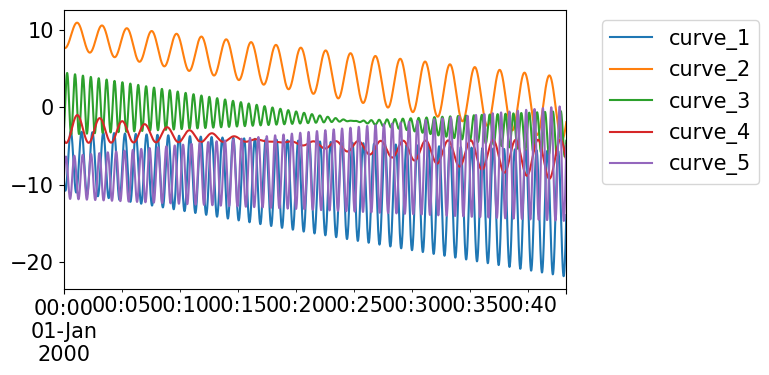

In [112]:
df1=generateSine(2600, 360, isAmpBig=True, isFreqVar=True)
df1.describe()
ax = df1[df1.columns[:5]].plot(figsize=(8, 4))
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

Forecasting batches:   0%|          | 0/60 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/60 [00:00<?, ?it/s]


Running evaluation: 60it [00:00, 264.76it/s]
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


0.21647640581414052


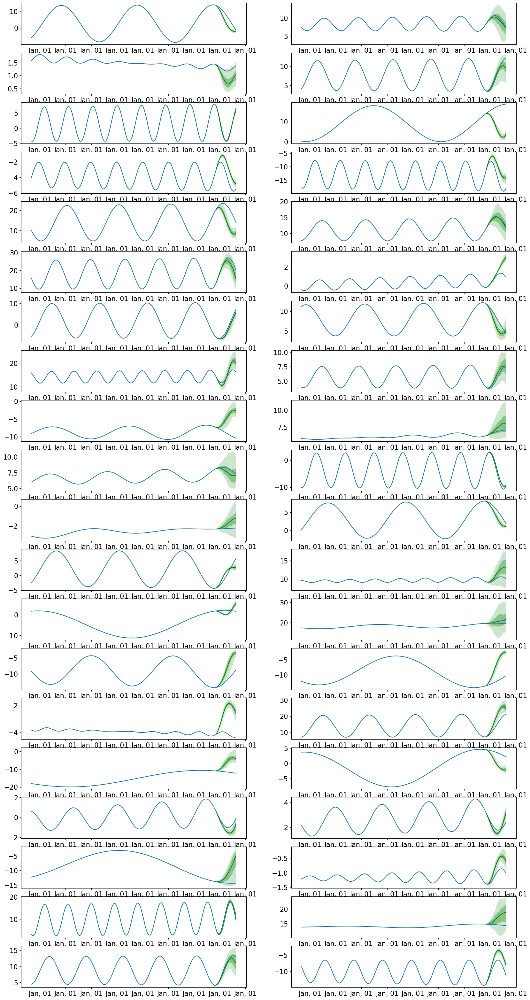

In [117]:
print(getCPRS(test_ds, predictor, prediction_length)) # 0.21647640581414052 

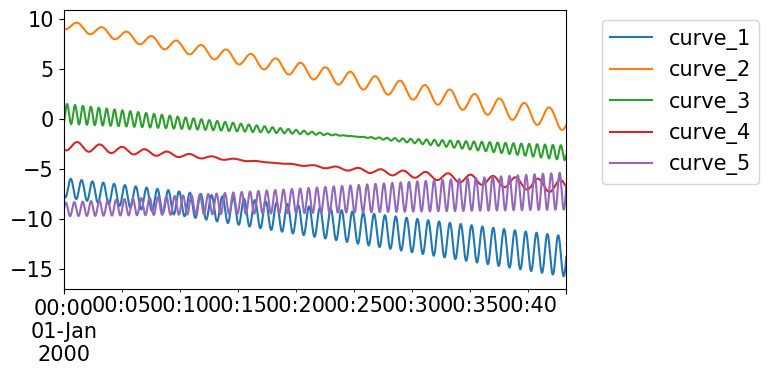

In [118]:
df2=generateSine(2600, 360, isAmpBig=False, isFreqVar=True)
df2.describe()
ax = df2[df2.columns[:5]].plot(figsize=(8, 4))
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

Forecasting batches:   0%|          | 0/60 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/60 [00:00<?, ?it/s]


Running evaluation: 60it [00:00, 232.96it/s]
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


0.32565477838074364


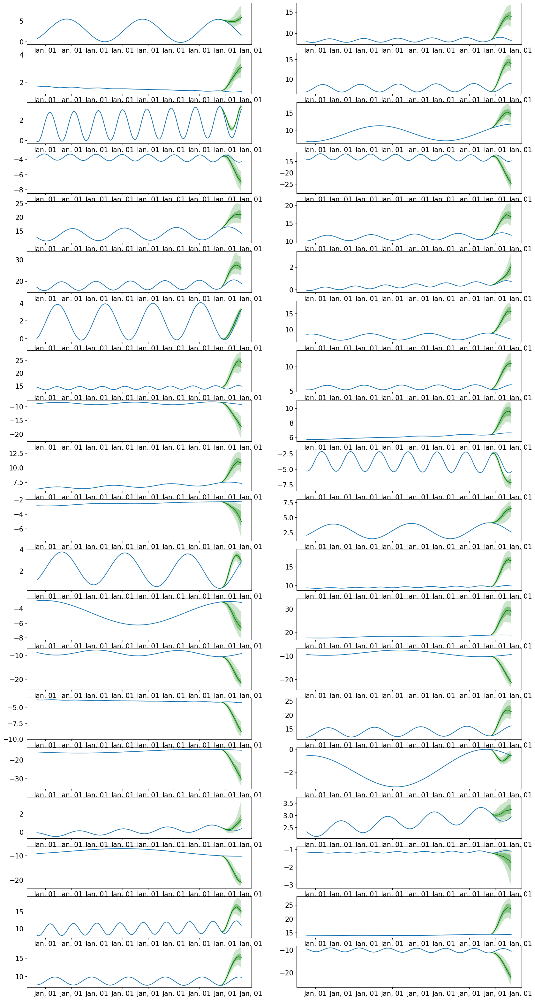

In [121]:
print(getCPRS(test_ds, predictor, prediction_length)) # 0.32565477838074364

### Frequency:
- df3: `c = 1`
- df4: `c = np.random.uniform(-1, 1)`

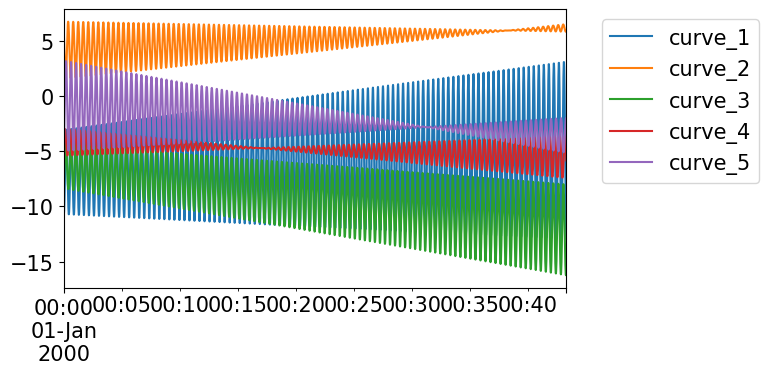

In [122]:
df3=generateSine(2600, 360, isAmpBig=True, isFreqVar=False)
df3.describe()
ax = df3[df3.columns[:5]].plot(figsize=(8, 4))
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

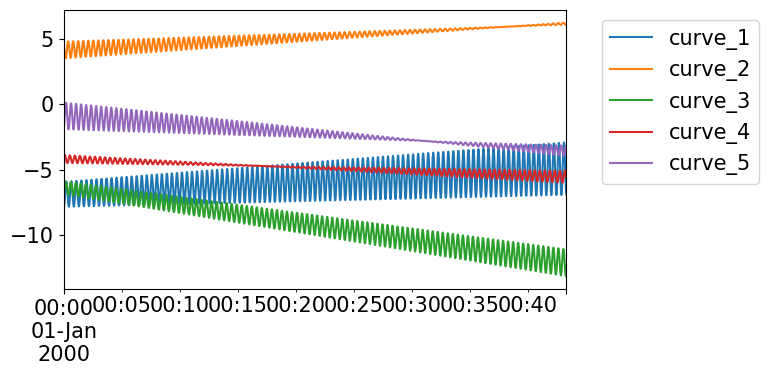

In [94]:
df4=generateSine(2600, 360, isAmpBig=False, isFreqVar=False)
df4.describe()
ax = df4[df4.columns[:5]].plot(figsize=(8, 4))
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [123]:
# import all the trajectories of sensor 14 from train_FD001 and train_FD003 (140, 128)
df=df3
train_data = [{"start": df[df.columns[:300]].index[0], "target": df[df.columns[:300]][i].values} for i in df[df.columns[:300]].columns]
train_ds = ListDataset(data_iter=train_data, freq='1s') # training dataset
test_data = [{"start": df[df.columns[-60:]].index[0], "target": df[df.columns[-60:]][i].values} for i in df[df.columns[-60:]].columns]
test_ds = ListDataset(data_iter=test_data, freq='1s') # training dataset

In [124]:
# initialize the estimator

prediction_length = 24
num_samples = 100
context_length = 96
device = "cuda:0"

ckpt = torch.load("lag-llama.ckpt", map_location=torch.device(device))
estimator_args = ckpt["hyper_parameters"]["model_kwargs"]
estimator = LagLlamaEstimator(
    ckpt_path="lag-llama.ckpt",
    prediction_length=prediction_length,
    context_length=context_length,
    nonnegative_pred_samples=False, # changed from True to False, allowing the model to give negative forecasts
    aug_prob=0,
    lr=10e-5,
    
    input_size=estimator_args["input_size"],
    n_layer=estimator_args["n_layer"],
    n_embd_per_head=estimator_args["n_embd_per_head"],
    n_head=estimator_args["n_head"],
    time_feat=estimator_args["time_feat"],
    
    rope_scaling={
        "type": "linear",
        "factor": max(1.0, (context_length + prediction_length) / estimator_args["context_length"]),
    },
    batch_size=32,
    num_parallel_samples=num_samples,
    trainer_kwargs={"max_epochs": 50},
)

# train the estimator
predictor = estimator.train(train_ds, cache_data=False, shuffle_buffer_length=1000) 
# for experiment, no need to cache the trained model

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/lightning/pytorch/trainer/configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Training: |                                               | 0/? [00:00<?, ?it/s]

Epoch 0, global step 50: 'train_loss' reached -0.07682 (best -0.07682), saving model to '/home/eragroup/Documents/Documents/Koutas_Master_Thesis_Supervision/Junbo_Leng/lag_llama_model/lag-llama-main/lightning_logs/version_16/checkpoints/epoch=0-step=50.ckpt' as top 1
Epoch 1, global step 100: 'train_loss' reached -0.77145 (best -0.77145), saving model to '/home/eragroup/Documents/Documents/Koutas_Master_Thesis_Supervision/Junbo_Leng/lag_llama_model/lag-llama-main/lightning_logs/version_16/checkpoints/epoch=1-step=100.ckpt' as top 1
Epoch 2, global step 150: 'train_loss' reached -0.98125 (best -0.98125), saving model to '/home/eragroup/Documents/Documents/Koutas_Master_Thesis_Supervision/Junbo_Leng/lag_llama_model/lag-llama-main/lightning_logs/version_16/checkpoints/epoch=2-step=150.ckpt' as top 1
Epoch 3, global step 200: 'train_loss' was not in top 1
Epoch 4, global step 250: 'train_loss' reached -0.99093 (best -0.99093), saving model to '/home/eragroup/Documents/Documents/Koutas_Mast

Forecasting batches:   0%|          | 0/200 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/200 [00:00<?, ?it/s]

Running evaluation: 200it [00:00, 1706.23it/s]
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up s

0.6321124526258297


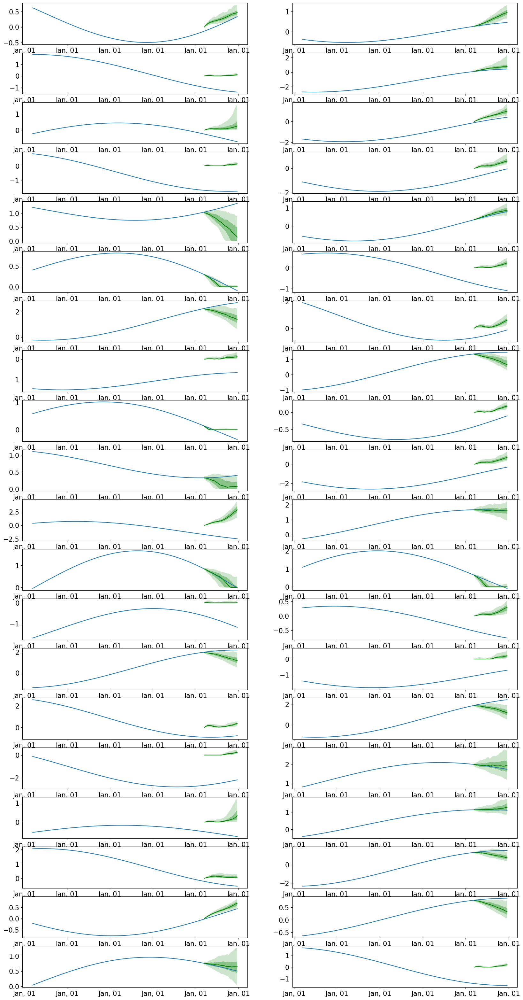

In [17]:
print(getCPRS(train_ds, predictor, )) # first run 

Forecasting batches:   0%|          | 0/200 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/200 [00:00<?, ?it/s]

Running evaluation: 200it [00:00, 2028.24it/s]
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up s

1.112122947351668


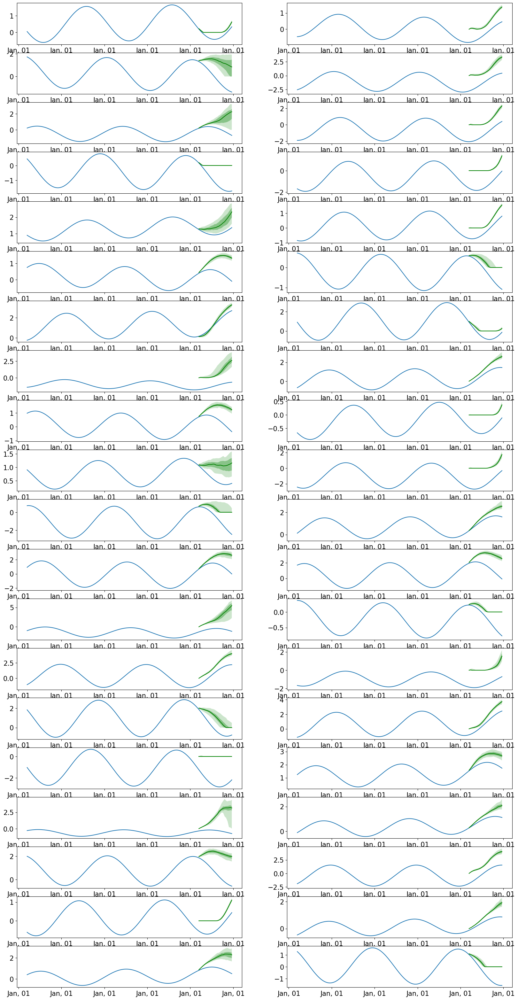

In [33]:
print(getCPRS(train_ds, predictor, )) # second run, higher frequency

Forecasting batches:   0%|          | 0/360 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/360 [00:00<?, ?it/s]

Running evaluation: 360it [00:00, 3759.69it/s]
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up s

0.526028452883102


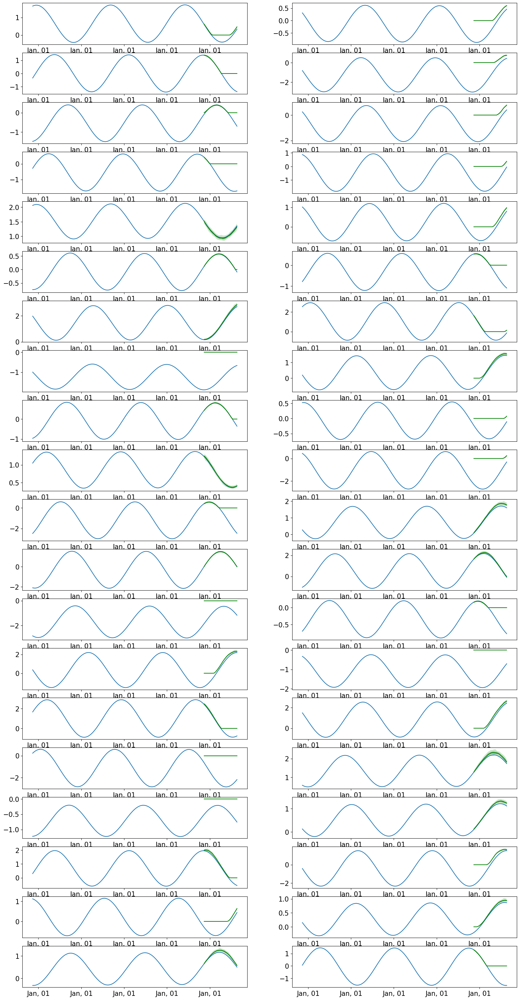

In [41]:
print(getCPRS(train_ds, predictor, )) # third run, 2600 timestamps instead of 300

Forecasting batches:   0%|          | 0/360 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/360 [00:00<?, ?it/s]

Running evaluation: 360it [00:00, 3074.08it/s]
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up s

1.3355140750155343


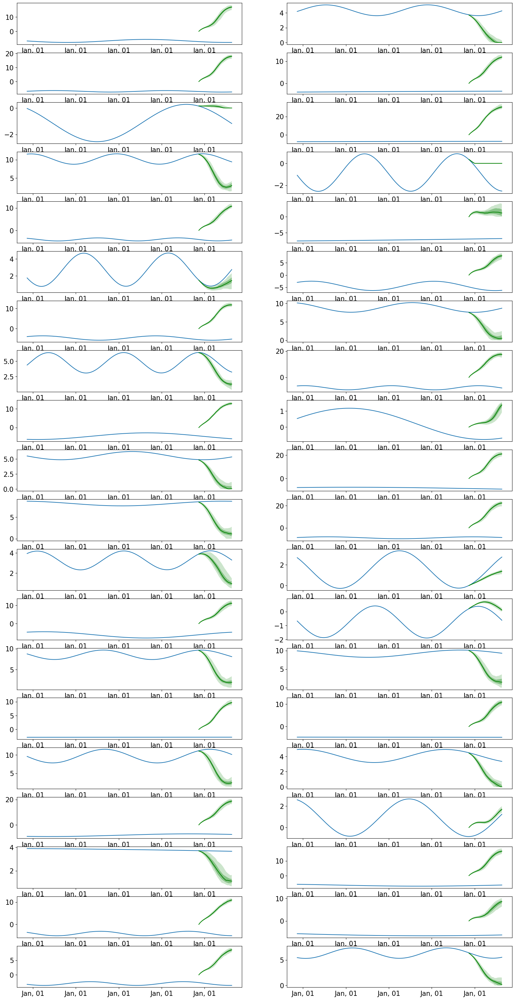

In [14]:
print(getCPRS(train_ds, predictor, )) # forth run, even more random than last time

Forecasting batches:   0%|          | 0/300 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/300 [00:00<?, ?it/s]

Running evaluation: 300it [00:00, 4356.04it/s]
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up s

0.5978881123366127


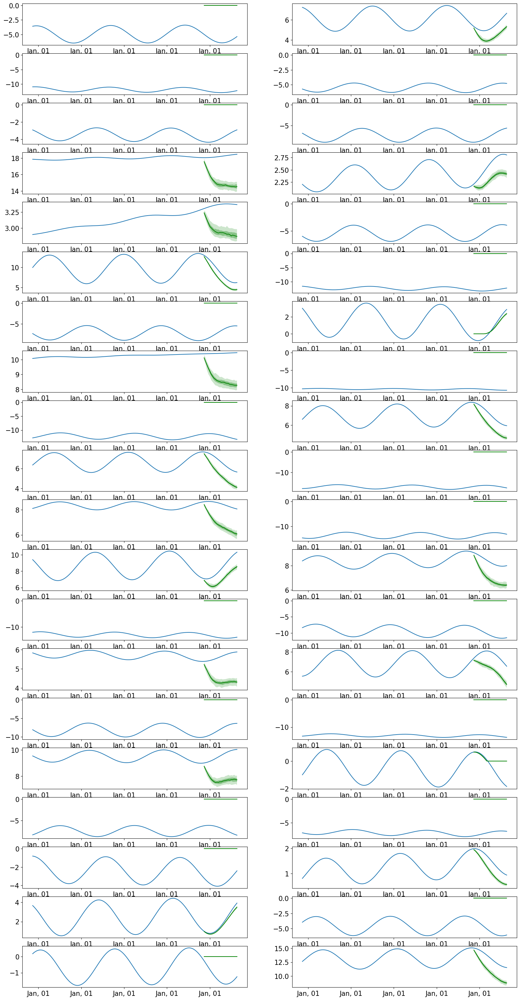

In [38]:
print(getCPRS(train_ds, predictor, )) 

Forecasting batches:   0%|          | 0/300 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/300 [00:00<?, ?it/s]

Running evaluation: 300it [00:00, 3035.13it/s]
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up s

0.5978478736503366


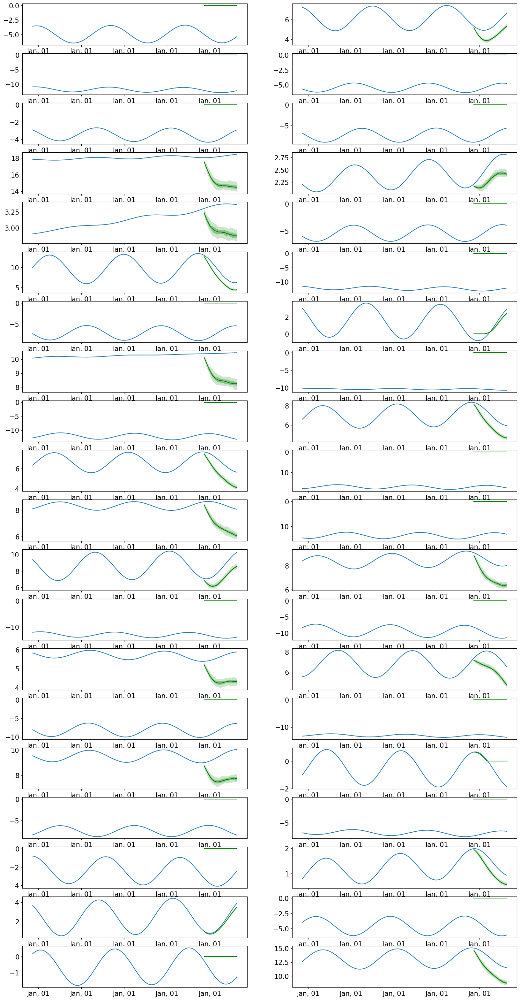

In [39]:
print(getCPRS(test_ds, predictor, )) 

Forecasting batches:   0%|          | 0/300 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/300 [00:00<?, ?it/s]

Running evaluation: 300it [00:00, 1370.11it/s]
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up s

0.540594534679292


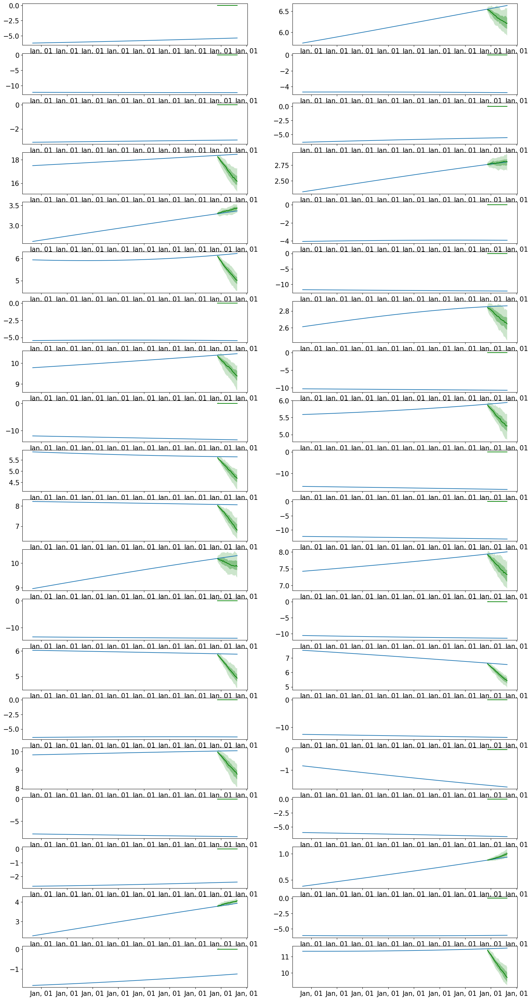

In [17]:
print(getCPRS(test_ds, predictor, prediction_length)) # 0.540594534679292

Forecasting batches:   0%|          | 0/300 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/300 [00:00<?, ?it/s]

Running evaluation: 300it [00:00, 1535.46it/s]
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up s

0.521006350153686


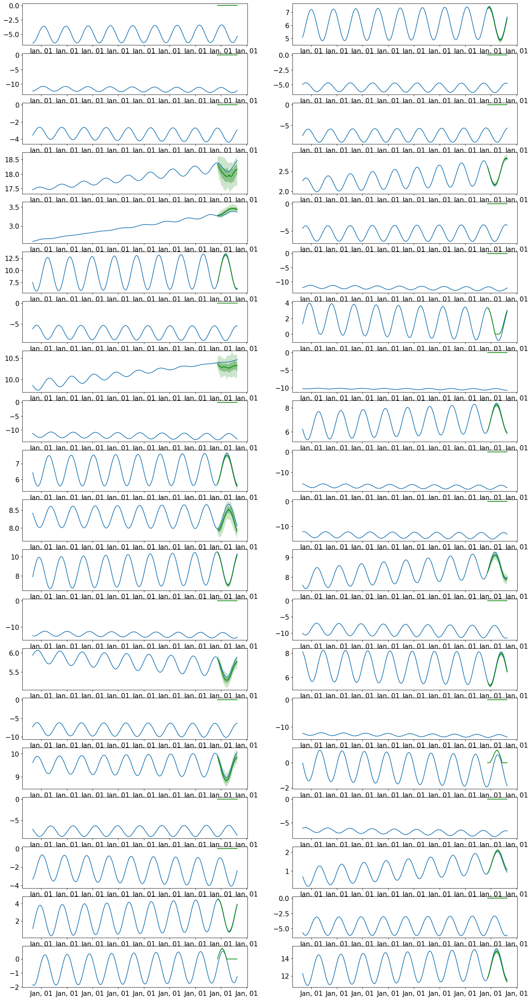

In [27]:
print(getCPRS(test_ds, predictor, prediction_length)) # CRPS: 0.521006350153686

Forecasting batches:   0%|          | 0/300 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/300 [00:00<?, ?it/s]

Running evaluation: 300it [00:00, 1623.19it/s]
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up s

0.5197535574680803


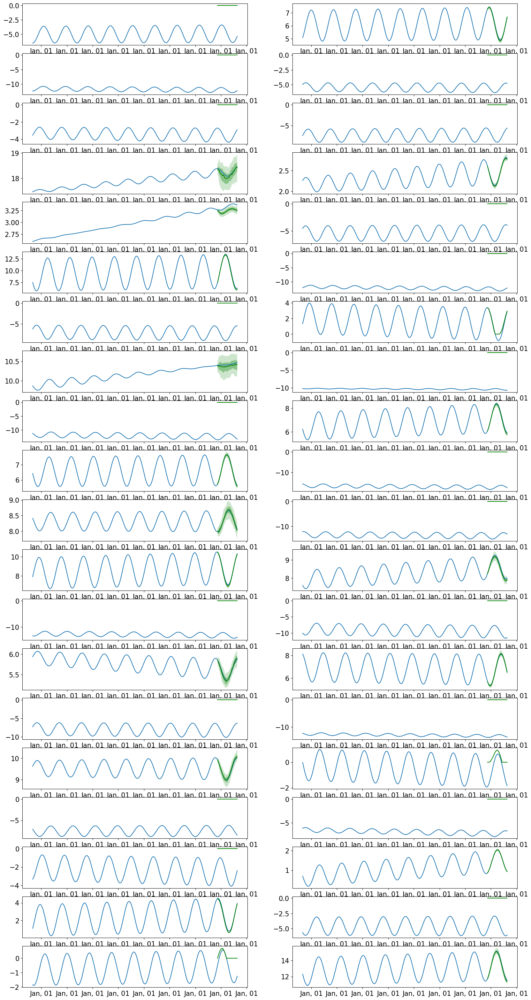

In [35]:
print(getCPRS(test_ds, predictor, prediction_length)) # 0.5197535574680803

### zero-shot on single trajectory 

In [67]:
def get_lag_llama_predictions(dataset, 
                              prediction_length, 
                              device, 
                              context_length=32, 
                              use_rope_scaling=False, 
                              num_samples=100):
    
    ckpt = torch.load("lag-llama.ckpt", map_location=device) # Uses GPU since in this Colab we use a GPU.
    estimator_args = ckpt["hyper_parameters"]["model_kwargs"]

    rope_scaling_arguments = {
        "type": "linear",
        "factor": max(1.0, (context_length + prediction_length) / estimator_args["context_length"]),
    }

    estimator = LagLlamaEstimator(
        ckpt_path="lag-llama.ckpt",
        prediction_length=prediction_length,
        context_length=context_length, # Lag-Llama was trained with a context length of 32, but can work with any context length

        # estimator args
        input_size=estimator_args["input_size"],
        n_layer=estimator_args["n_layer"],
        n_embd_per_head=estimator_args["n_embd_per_head"],
        n_head=estimator_args["n_head"],
        scaling=estimator_args["scaling"],
        time_feat=estimator_args["time_feat"],
        
        rope_scaling=rope_scaling_arguments if use_rope_scaling else None,

        batch_size=1,
        num_parallel_samples=100,
        device=device,
    )

    lightning_module = estimator.create_lightning_module()
    transformation = estimator.create_transformation()
    predictor = estimator.create_predictor(transformation, lightning_module)

    forecast_it, ts_it = make_evaluation_predictions(
        dataset=dataset,
        predictor=predictor,
        num_samples=num_samples
    )
    forecasts = list(forecast_it)
    tss = list(ts_it)

    return forecasts, tss

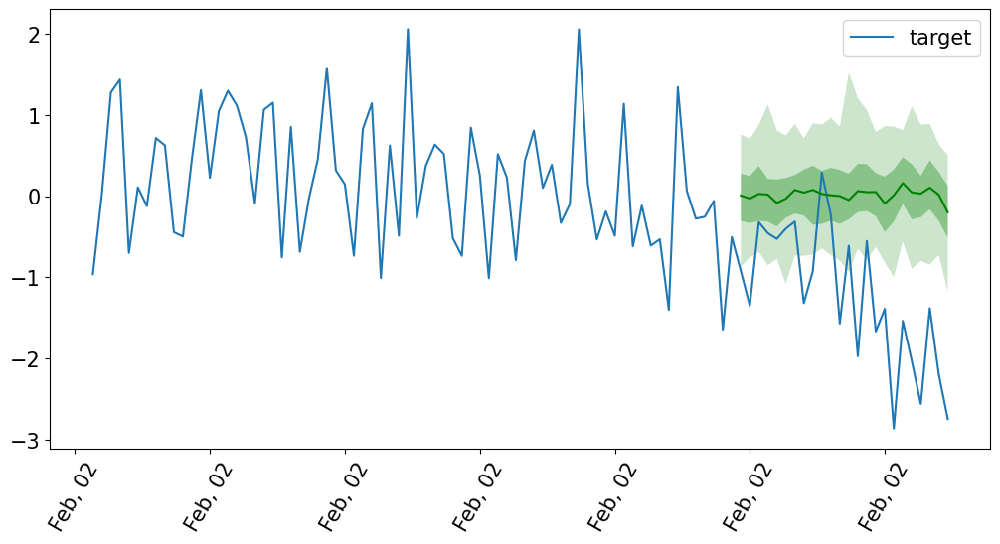

In [70]:
forecasts, tss = get_lag_llama_predictions(train_ds, prediction_length, torch.device("cuda:0"), num_samples)
plt.figure(figsize=(20, 60))
date_formater = mdates.DateFormatter('%b, %d')
plt.rcParams.update({'font.size': 15})

# Iterate through the first 9 series, and plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts, tss)), 21):
    ax = plt.subplot(11, 2, idx+1)

    plt.plot(ts[-4 * prediction_length:].to_timestamp(), label="target", ) # only shows the last 4 prediction lengths
    forecast.plot( color='g')
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

Forecasting batches:   0%|          | 0/360 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/360 [00:00<?, ?it/s]

Running evaluation: 360it [00:00, 3742.60it/s]
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up s

0.5509503116645174


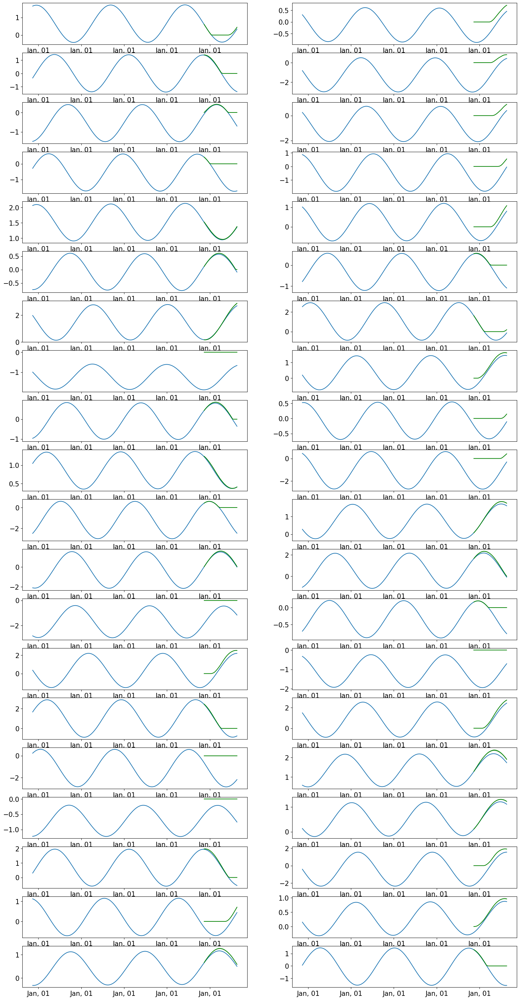

In [47]:
print(getCPRS(train_ds, predictor, )) 

In [46]:
torch.cuda.empty_cache()

Forecasting batches:   0%|          | 0/300 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/300 [00:00<?, ?it/s]

Running evaluation: 300it [00:00, 1817.35it/s]
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up s

0.016453493358957502


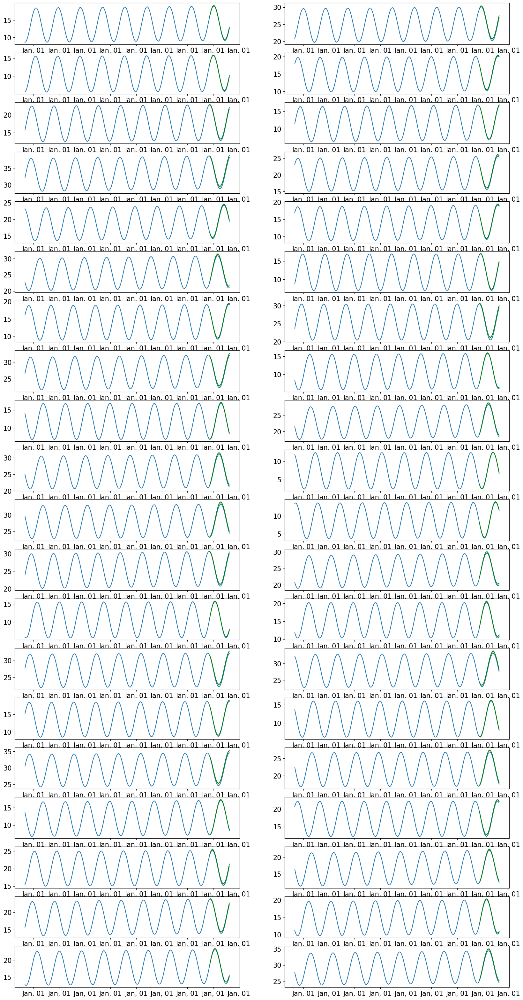

In [54]:
print(getCPRS(test_ds, predictor, prediction_length)) # all positve input values this time CPRS: 0.016453493358957502

Forecasting batches:   0%|          | 0/300 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/300 [00:00<?, ?it/s]

Running evaluation: 300it [00:00, 1787.12it/s]
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up s

0.04316408950702583


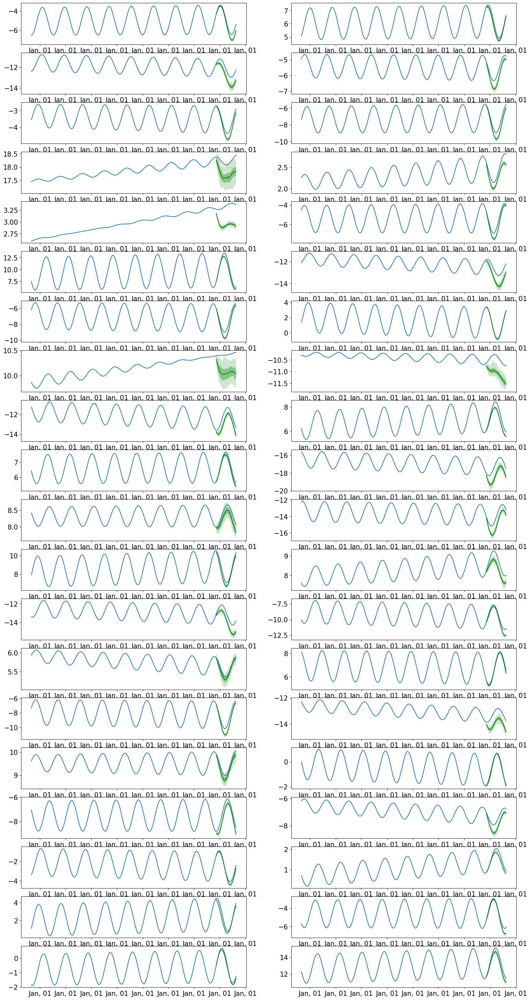

In [63]:
print(getCPRS(test_ds, predictor, prediction_length)) # set nonnegative_pred_samples=False

Forecasting batches:   0%|          | 0/60 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/60 [00:00<?, ?it/s]


Running evaluation: 60it [00:00, 239.90it/s]
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


0.010003842004841527


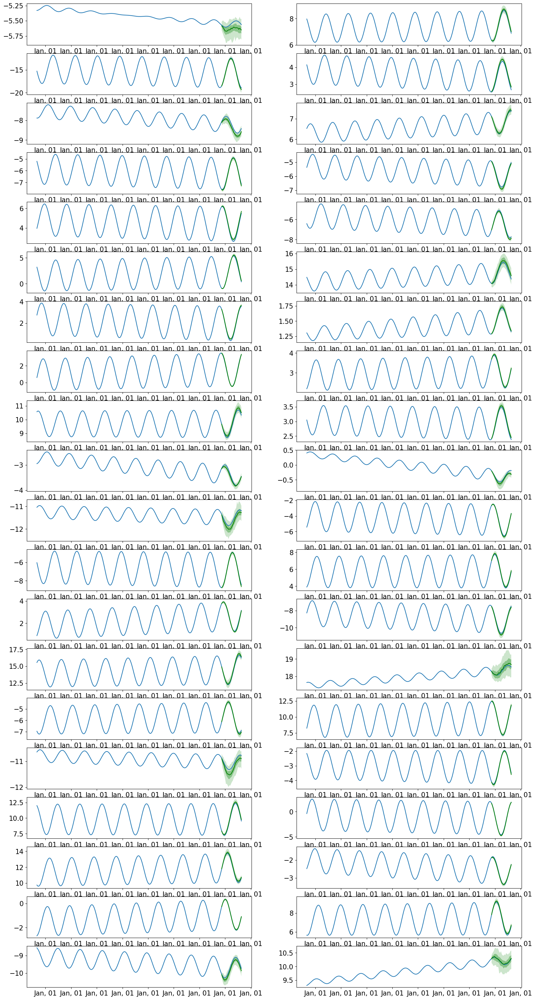

In [105]:
print(getCPRS(test_ds, predictor, prediction_length)) # set nonnegative_pred_samples=False

Forecasting batches:   0%|          | 0/60 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/60 [00:00<?, ?it/s]


Running evaluation: 60it [00:00, 247.53it/s]
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/home/eragroup/anaconda3/envs/lag_llama/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


0.033251243005659833


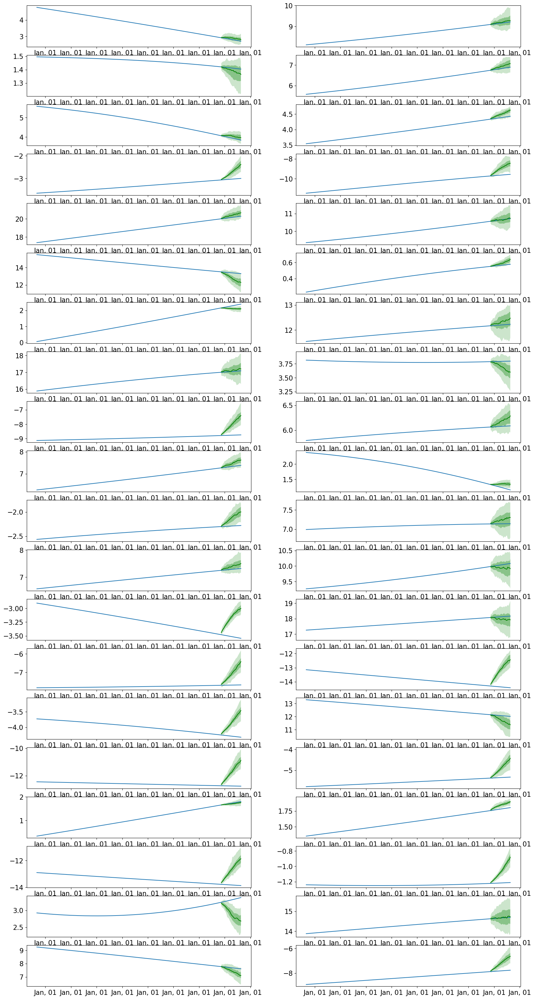

In [108]:
print(getCPRS(test_ds, predictor, prediction_length)) # set nonnegative_pred_samples=False, low frequency
